In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

import matplotlib.pyplot as plt
import os
import numpy as np
from tf_util.tf_util import get_initdir, get_archstring

os.chdir('../')

/Users/sbittner/anaconda/envs/dsn/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 88 from C header, got 96 from PyObject
  return f(*args, **kwds)


In [32]:
from efn.util.plot_util import find_last_ind

D = 8
sigma_init = 1.0
num_masks_list = [2, 4]
nlayers_list = [1, 2, 4]
upl_list = [5, 10, 20]
rs_list = [1, 2, 3, 4, 5]

num_num_masks = len(num_masks_list)
num_nlayers = len(nlayers_list)
num_upls = len(upl_list)
num_rs = len(rs_list)

arch_strings = []
its_list = []
R2s_list = []
KLs_list = []
Z_list = []

for i in range(num_num_masks):
    num_masks = num_masks_list[i]
    for j in range(num_nlayers):
        nlayers = nlayers_list[j]
        for k in range(num_upls):
            upl = upl_list[k]
            for ii in range(num_rs):
                random_seed = rs_list[ii]
                
                real_nvp_arch = {"num_masks":num_masks,
                                 "nlayers":nlayers,
                                 "upl":upl}
                arch_dict = {"D":D,
                                "mult_and_shift":None,
                                "latent_dynamics": None,
                                "TIF_flow_type": "RealNVP",
                                "repeats": 1,
                                "real_nvp_arch":real_nvp_arch
                            }
                arch_string = get_archstring(arch_dict)
                arch_strings.append(arch_string)
                
                initdir = get_initdir(D, arch_dict, sigma_init, random_seed)
                
                npzfile = np.load(initdir + 'opt_info.npz')
                R2s = npzfile['train_R2s'];
                KLs = npzfile['train_KLs'];
                Z = npzfile['Z']
                check_rate = npzfile['check_rate'];
                last_ind = find_last_ind(R2s)
                its = np.arange(0, check_rate*last_ind, check_rate);
                its_list.append(its)
                R2s_list.append(R2s[:last_ind,0])
                KLs_list.append(KLs[:last_ind,0])
                Z_list.append(Z[0])

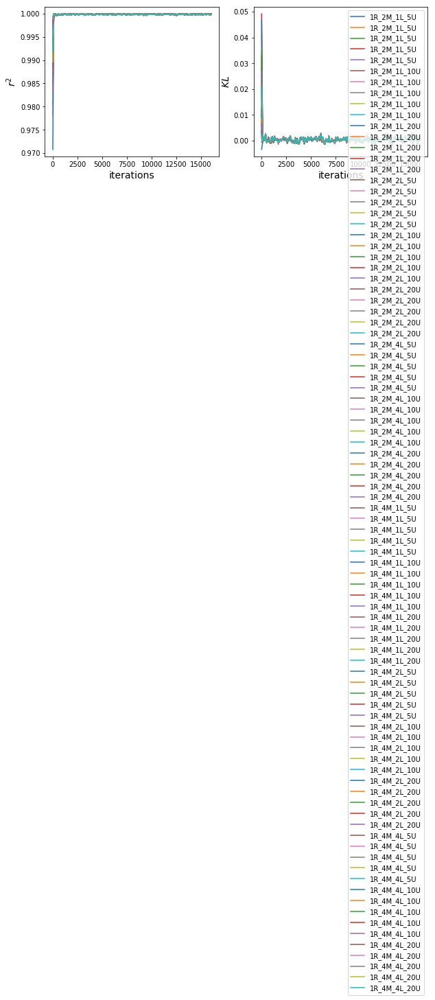

In [33]:
fontsize = 14
ind = 0
fig, axs = plt.subplots(1, 2, figsize=(10, 4))
for i in range(num_num_masks):
    num_masks = num_masks_list[i]
    for j in range(num_nlayers):
        nlayers = nlayers_list[j]
        for k in range(num_upls):
            upl = upl_list[k]
            for ii in range(num_rs):
                random_seed = rs_list[ii]
                
                its = its_list[ind]
                R2s = R2s_list[ind]
                KLs = KLs_list[ind]
                
                axs[0].plot(its, R2s)
                axs[0].set_xlabel('iterations', fontsize=fontsize)
                axs[0].set_ylabel(r'$r^2$', fontsize=fontsize)
                
                axs[1].plot(its, KLs, label=arch_strings[ind])
                axs[1].set_xlabel('iterations', fontsize=fontsize)
                axs[1].set_ylabel(r'$KL$', fontsize=fontsize)
                
                ind += 1
plt.legend()
plt.show()
                

['dim1', 'dim2', 'dim3', 'dim4', 'dim5', 'dim6', 'dim7', 'dim8']


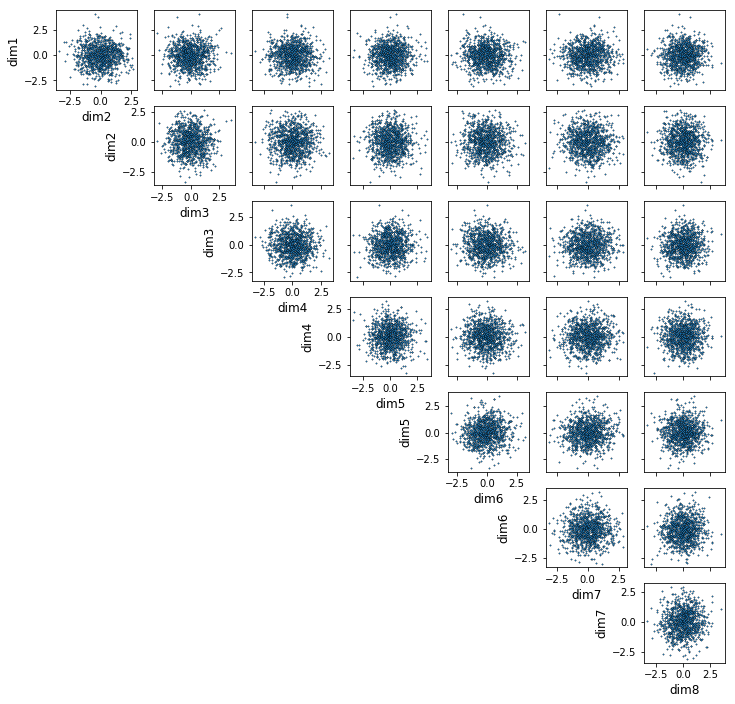

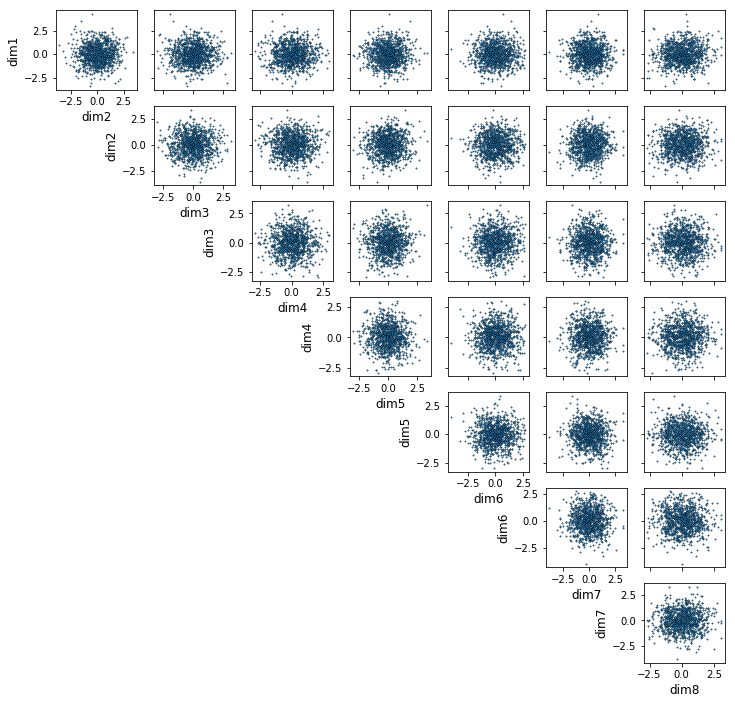

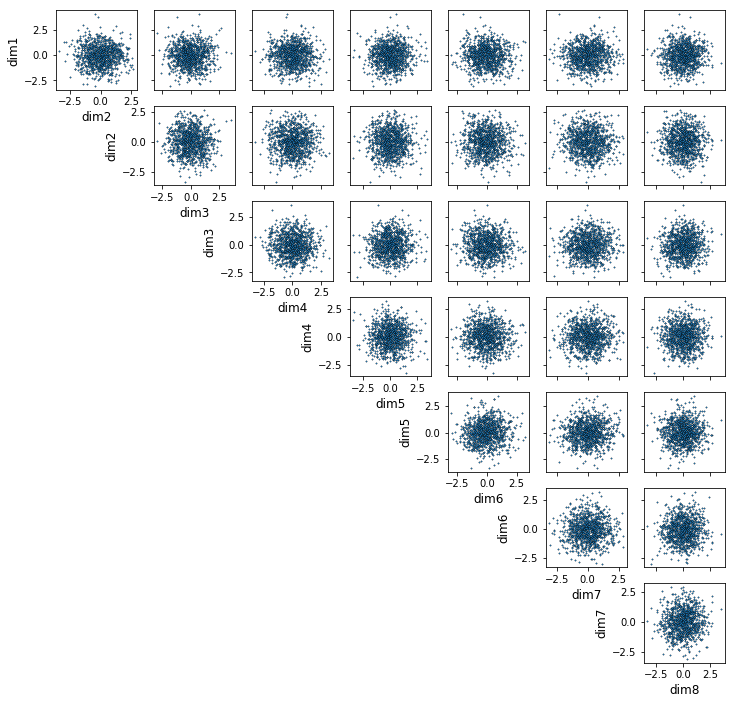

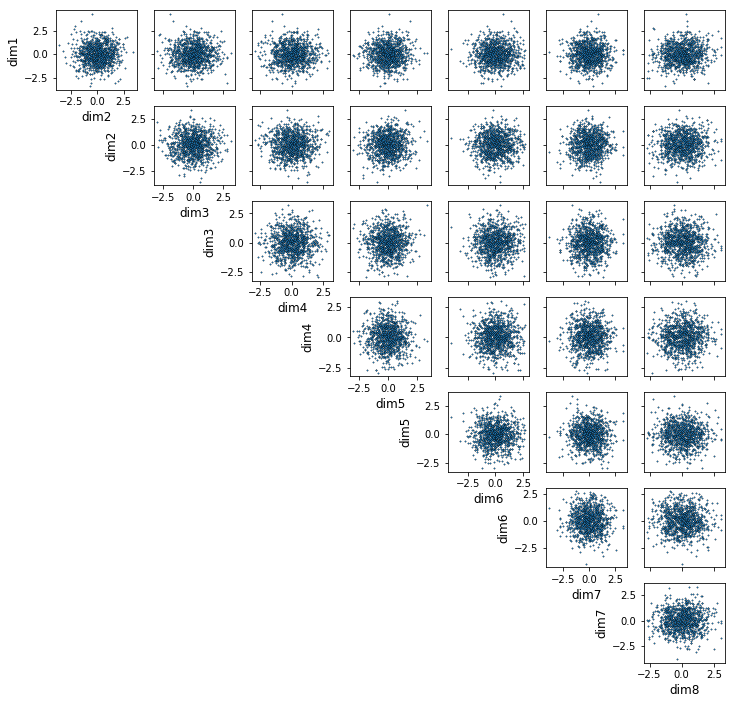

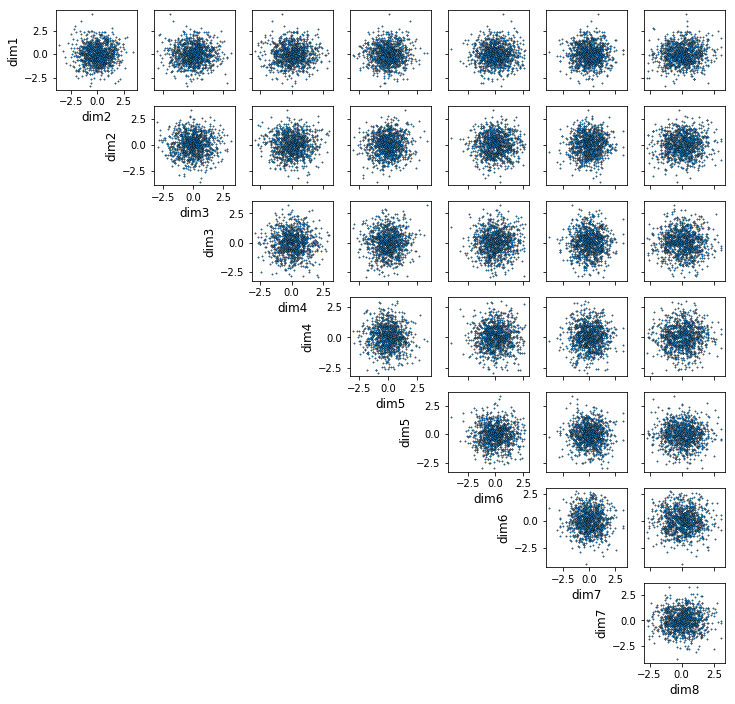

...

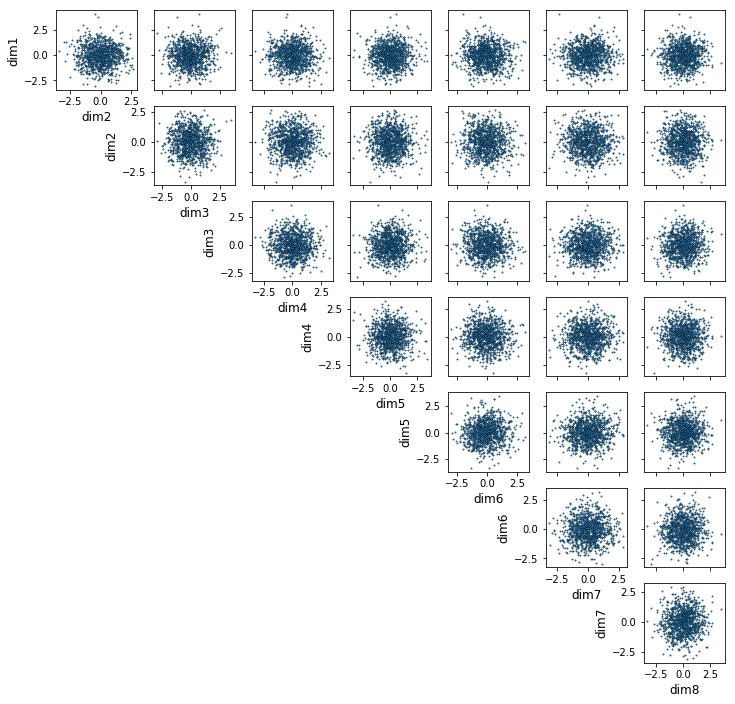

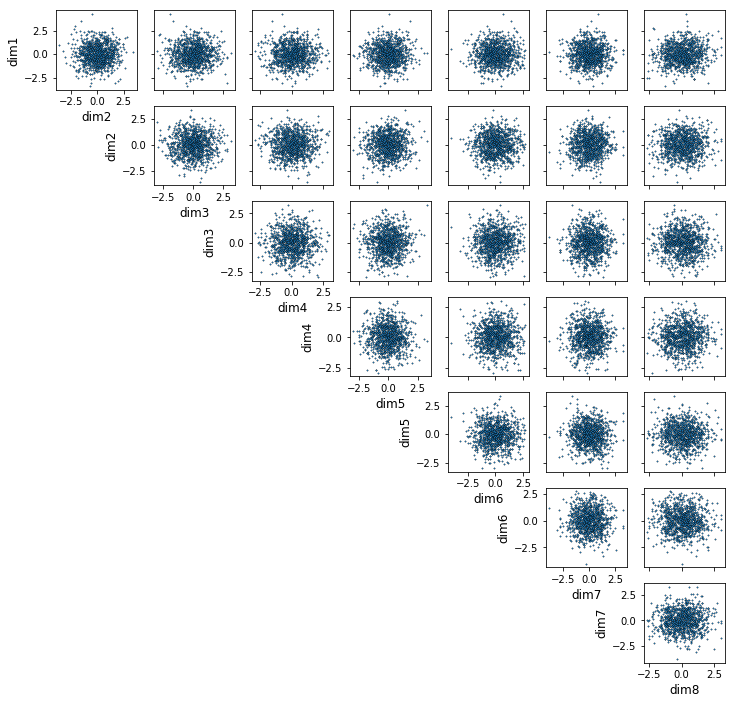

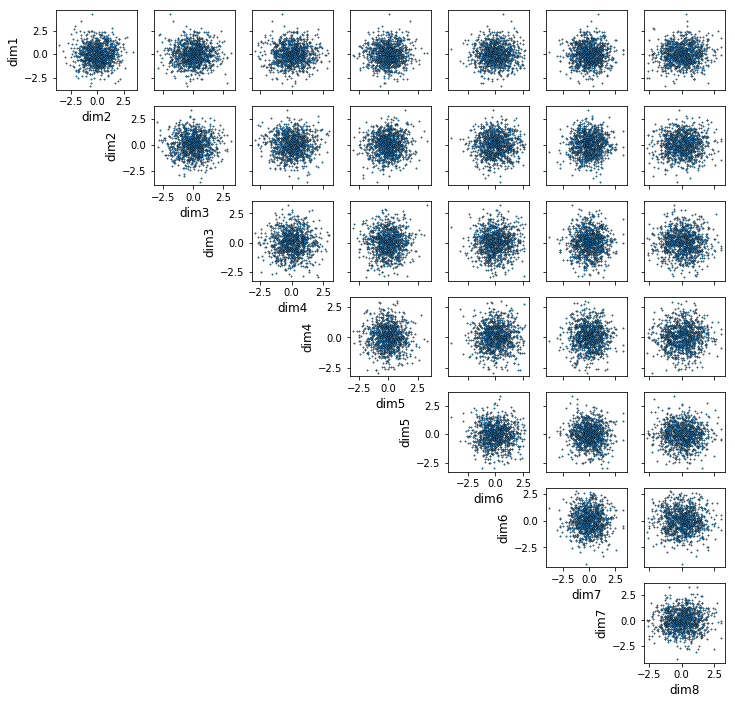

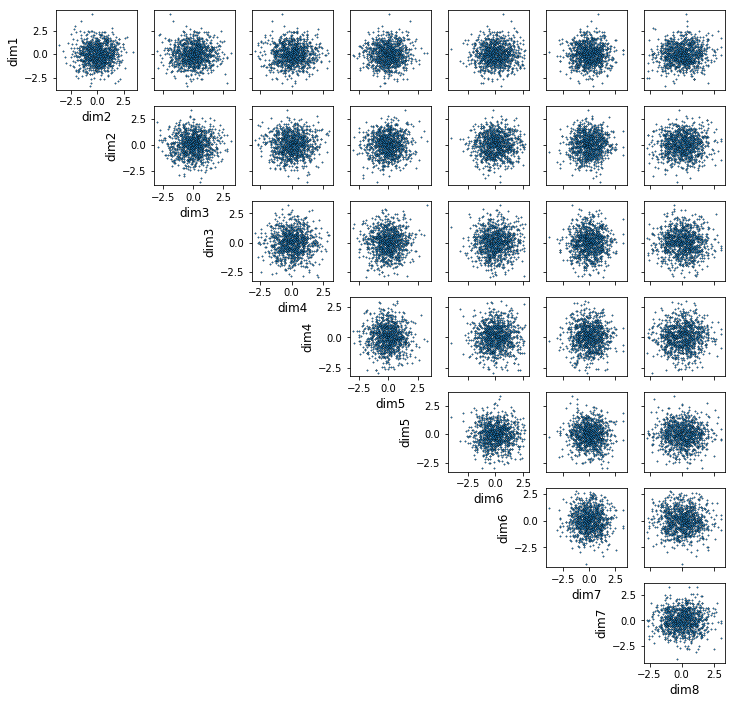

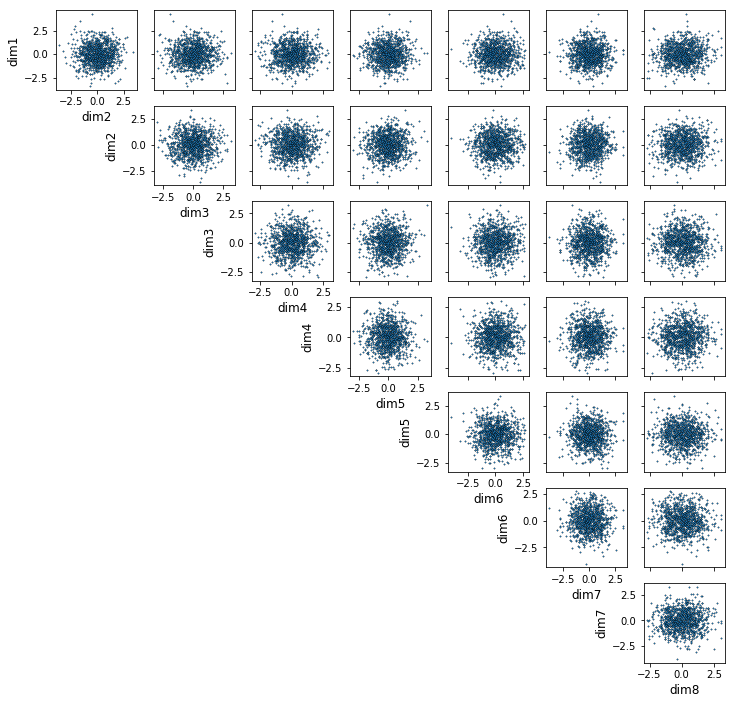

In [ ]:
from dsn.util.plot_util import pairplot

labels = ['dim%d' % i for i in range(1, 9)]
print(labels)

fontsize = 14
ind = 0
for i in range(num_num_masks):
    num_masks = num_masks_list[i]
    for j in range(num_nlayers):
        nlayers = nlayers_list[j]
        for k in range(num_upls):
            upl = upl_list[k]
            for ii in range(num_rs):
                random_seed = rs_list[ii]
                
                Z = Z_list[ind]
                
                pairplot(Z, range(8), labels)
                
                
                ind += 1